# Step 1: Import Dataset

In [4]:
# Library to import data
import pandas as pd

Ibrahim Data

In [ ]:
# Importing Ibrahim Dataset
ibrahim_data = pd.read_csv('./Dataset/new ibrahim karatas/kaggle_fake_train/kaggle_fake_train.csv')

Jair Data

In [ ]:
# Importing Jair Dataset
Jair_data_1 = pd.read_csv('./Dataset/new Jair Ribeiro/True.csv')
Jair_data_2 = pd.read_csv('./Dataset/new Jair Ribeiro/Fake.csv')

In [7]:
Jair_data_1['label'] = 1
Jair_data_2['label'] = 0

In [8]:
# Merge data1, data2
Jair_data = pd.concat([Jair_data_1, Jair_data_2])

Rahul Data

In [ ]:
# Importing Rahul Dataset
Rahul_data = pd.read_csv('./Dataset/new Rahul Thorat/fakenews.csv')

Elvin Data

In [ ]:
# Importing Elvin Dataset
elvin_data_1 = pd.read_csv('./Dataset/ELVIN AGHAMMADZADA/Y_Constraint_Train.csv')
elvin_data_2 = pd.read_csv('./Dataset/ELVIN AGHAMMADZADA/Y_Constraint_Val.csv')
elvin_data_3 = pd.read_csv('./Dataset/ELVIN AGHAMMADZADA/Y_english_test_with_labels.csv')

In [11]:
# Merge data1, data2, data3
elvin_data = pd.concat([elvin_data_1, elvin_data_2, elvin_data_3])

Jruvika Data

In [ ]:
# Importing Jruvika Dataset
jruvika_data = pd.read_csv('./Dataset/JRUVIKA/data.csv')

Saurabh Data

In [ ]:
# Importing Saurabh Dataset
saurabh_data = pd.read_csv('./Dataset/SAURABH SHAHANE/WELFake_Dataset.csv')

Challenge Data

In [ ]:
# Importing Challenge Dataset
challenge_data_1 = pd.read_csv('./Dataset/Challenge/train.csv')
challenge_data_2 = pd.read_csv('./Dataset/Challenge/test.csv')
challenge_data_3 = pd.read_csv('./Dataset/Challenge/submit.csv')

In [15]:
# Merge data with its labelling
challenge_data_4 = pd.merge(challenge_data_2, challenge_data_3, on='id', how='left')

In [16]:
# Merge data1, data4
challenge_data = pd.concat([challenge_data_1, challenge_data_4])

IEEE Data

In [ ]:
# Importing IEEE Dataset
ieee_data_1 = pd.read_csv('./Dataset/IEEE-FNID-dataset/fake news detection(FakeNewsNet)/fnn_dev.csv')
ieee_data_2 = pd.read_csv('./Dataset/IEEE-FNID-dataset/fake news detection(FakeNewsNet)/fnn_test.csv')
ieee_data_3 = pd.read_csv('./Dataset/IEEE-FNID-dataset/fake news detection(FakeNewsNet)/fnn_train.csv')

In [21]:
# Merge data1, data2, data3, data4, data5, data6
ieee_data = pd.concat([ieee_data_1, ieee_data_2, ieee_data_3])

# Step 2: Data Understanding and Visualization

Preparation of Data Understanding

In [23]:
# Import necessary library for visualization
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer

# Download necessary NLTK data
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

# Define stop words, and lemmatizer
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

# NLP Pre-processing
def pp(text):
  text = text.lower() if isinstance(text, str) else ''  # Convert to lowercase if text is a string

  # Remove URL
  text = re.sub(r'http\S+|https?://\S+|www.\.\S+', '', text)

  # Remove HTML tags
  text = re.sub(r'<.*?>', '', text)

  # Remove Punctuation
  text = re.sub(r'[^\w\s]', '', text)

  # Remove Numbers
  text = re.sub(r'\d', '', text)

  # Remove Newline Characters
  text = re.sub(r'\n', ' ', text)

  tokens = nltk.word_tokenize(text)  # Tokenize
  tokens = [word for word in tokens if word not in stop_words]  # Remove stop words
  tokens = [lemmatizer.lemmatize(word) for word in tokens]  # Lemmatize
  return ' '.join(tokens)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\User10\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\User10\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\User10\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Ibrahim Data

In [110]:
# Check the total rows of data
total_data = len(ibrahim_data)
print("\nTotal rows of Ibrahim data:", total_data)


Total rows of Ibrahim data: 20800


In [111]:
# Display first five rows
ibrahim_data.head()

,id,title,author,text,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1


In [112]:
# Display all columns in dataset
ibrahim_data.columns

Index(['id', 'title', 'author', 'text', 'label'], dtype='object')

In [113]:
# Checking missing values 
ibrahim_data.isnull().sum() 

id           0
title      558
author    1957
text        39
label        0
dtype: int64

In [114]:
# Check of duplicate values
ibrahim_data['text'].duplicated().sum()

413

In [115]:
# Check the total number of data points
total_data_points = len(ibrahim_data)
print("\nTotal number of data points:", total_data_points)


Total number of data points: 20800


In [116]:
# Occurrences of each unique value in 'label' column
ibrahim_data['label'].value_counts()

label
1    10413
0    10387
Name: count, dtype: int64

<Axes: xlabel='label', ylabel='count'>

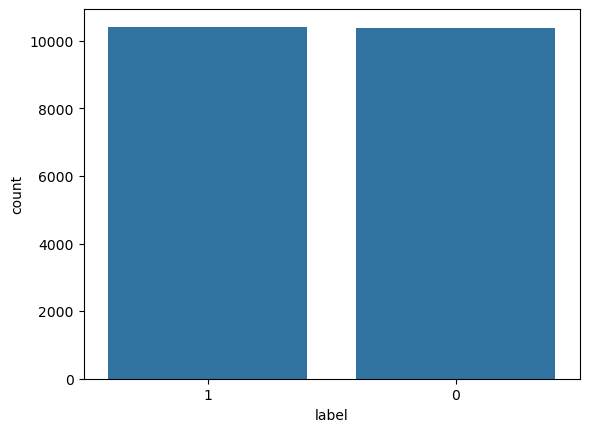

In [117]:
# Occurrences of each unique value in 'label' column (Bar Chart)
sns.countplot(data=ibrahim_data,
	x='label',
	order=ibrahim_data['label'].value_counts().index)

In [118]:
# NLP Pre-processing of data
ibrahim_data["text"] = ibrahim_data["text"].apply(pp)

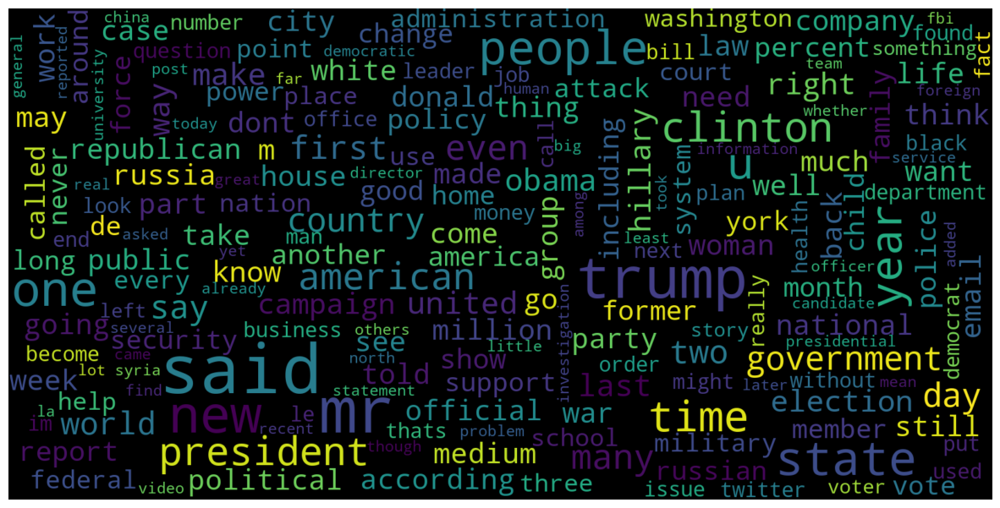

In [119]:
# Word cloud of all articles
consolidated = ' '.join(
	word for word in ibrahim_data['text'].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

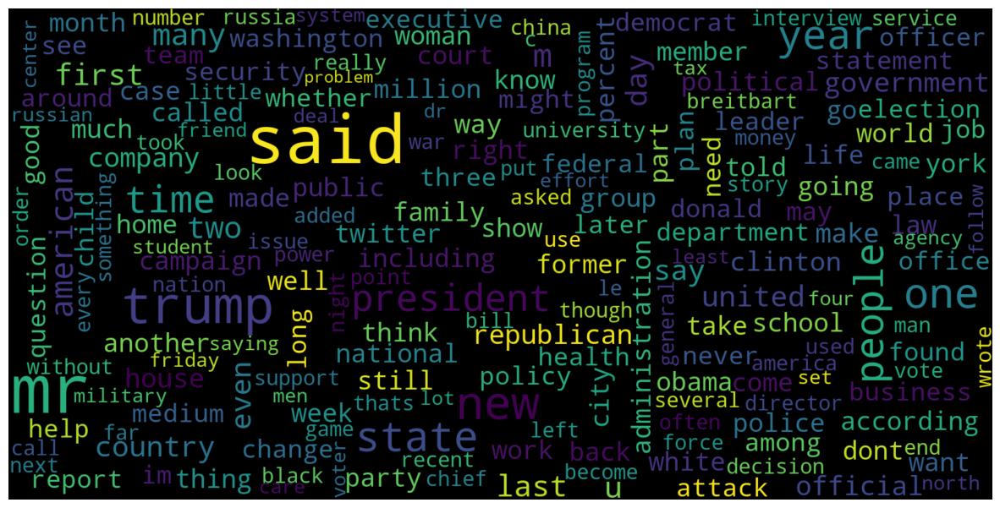

In [120]:
# Word cloud of real articles
consolidated = ' '.join(
	word for word in ibrahim_data['text'][ibrahim_data['label'] == 0].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

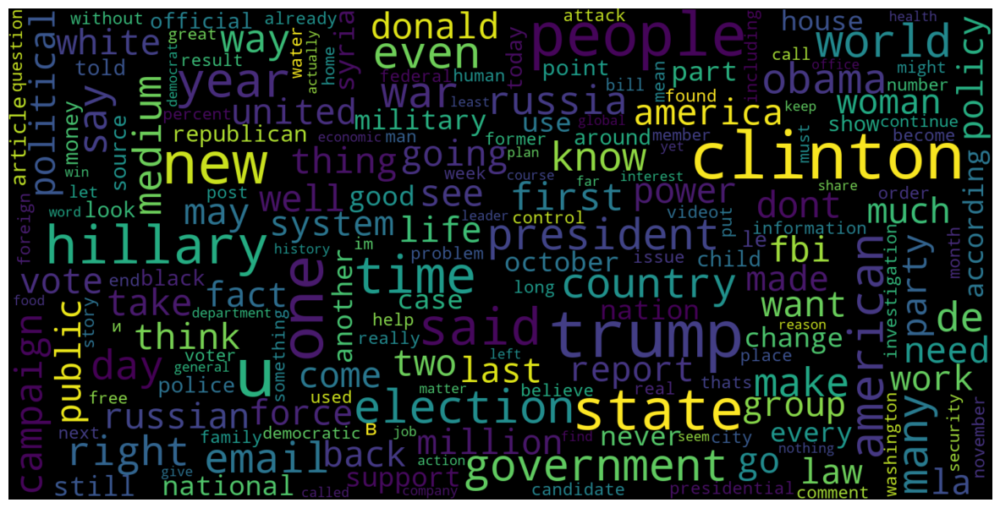

In [121]:
# Word cloud of fake articles
consolidated = ' '.join(
	word for word in ibrahim_data['text'][ibrahim_data['label'] == 1].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

<Axes: title={'center': 'Histogram of Top Words Frequency'}, xlabel='Top Words', ylabel='Count'>

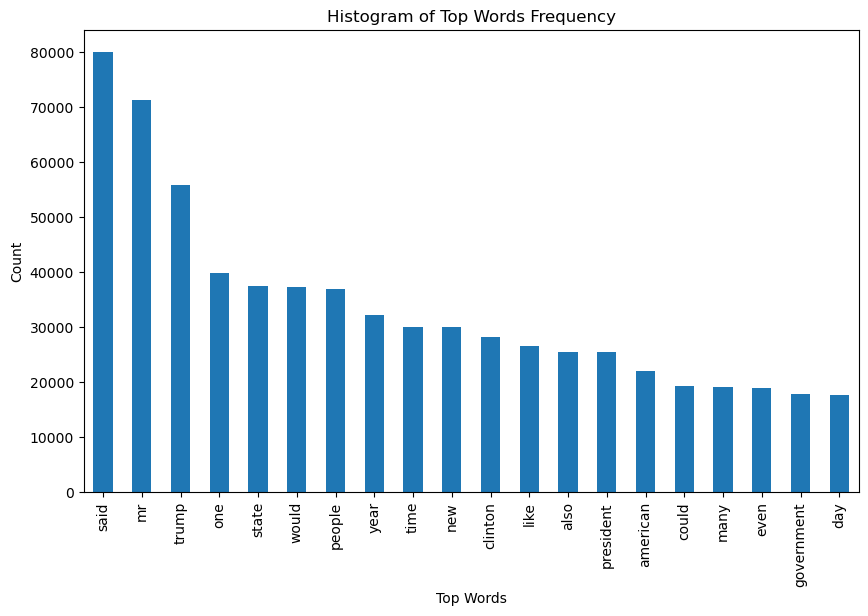

In [122]:
# Frequency of words occured
def get_top_n_words(corpus, n=None):
	vec = CountVectorizer().fit(corpus)
	bag_of_words = vec.transform(corpus)
	sum_words = bag_of_words.sum(axis=0)
	words_freq = [(word, sum_words[0, idx])
				for word, idx in vec.vocabulary_.items()]
	words_freq = sorted(words_freq, key=lambda x: x[1],
						reverse=True)
	return words_freq[:n]


common_words = get_top_n_words(ibrahim_data['text'], 20)
df1 = pd.DataFrame(common_words, columns=['Review', 'count'])

df1.groupby('Review').sum()['count'].sort_values(ascending=False).plot(
	kind='bar',
	figsize=(10, 6),
	xlabel="Top Words",
	ylabel="Count",
	title="Histogram of Top Words Frequency"
)

Jair Data

In [123]:
# Check the total rows of data
total_data = len(Jair_data)
print("\nTotal rows of Jair data:", total_data)


Total rows of Jair data: 44898


In [124]:
# Display first five rows
Jair_data.head()

,title,text,subject,date,label
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1


In [125]:
# Display all columns in dataset
Jair_data.columns

Index(['title', 'text', 'subject', 'date', 'label'], dtype='object')

In [126]:
# Checking missing values 
Jair_data.isnull().sum() 

title      0
text       0
subject    0
date       0
label      0
dtype: int64

In [127]:
# Check of duplicate values
Jair_data['text'].duplicated().sum()

6252

In [128]:
# Check the total number of data points
total_data_points = len(Jair_data)
print("\nTotal number of data points:", total_data_points)


Total number of data points: 44898


In [129]:
# Occurrences of each unique value in 'label' column
Jair_data['label'].value_counts()

label
0    23481
1    21417
Name: count, dtype: int64

<Axes: xlabel='label', ylabel='count'>

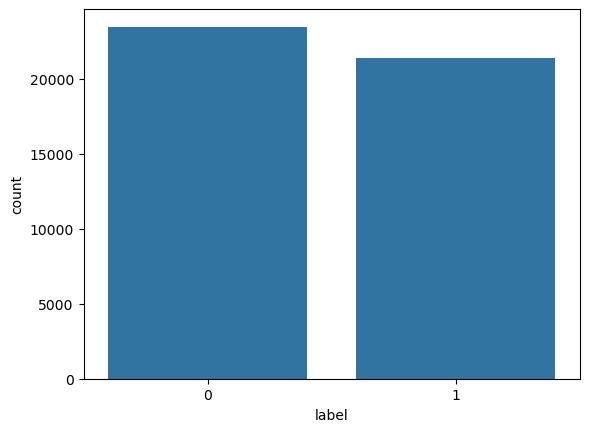

In [130]:
# Occurrences of each unique value in 'label' column (Bar Chart)
sns.countplot(data=Jair_data,
	x='label',
	order=Jair_data['label'].value_counts().index)

In [132]:
# NLP Pre-processing of data
Jair_data["text"] = Jair_data["text"].apply(pp)

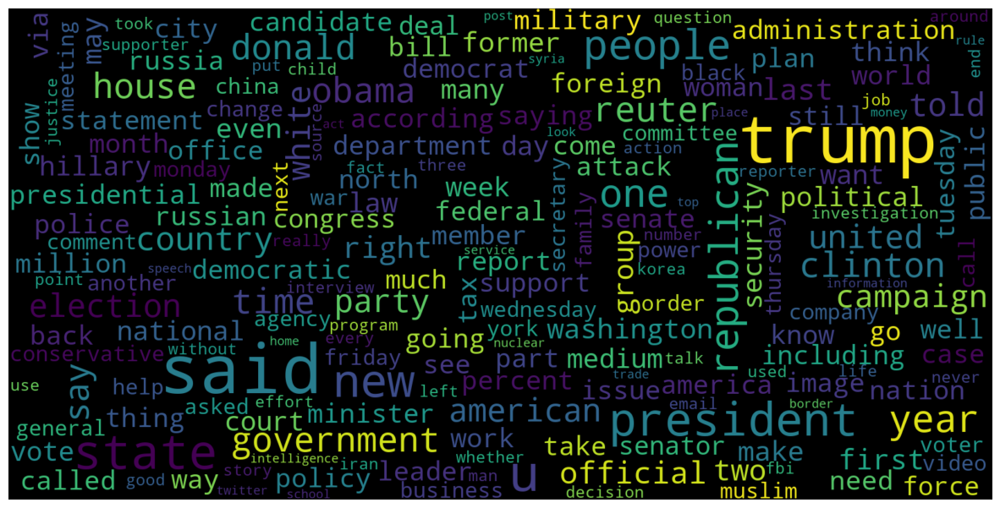

In [133]:
# Word cloud of all articles
consolidated = ' '.join(
	word for word in Jair_data['text'].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

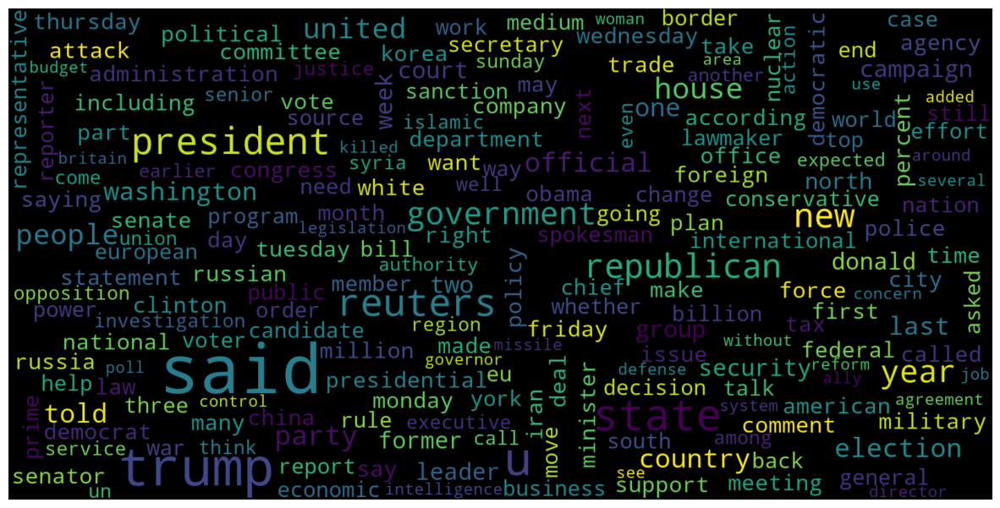

In [134]:
# Word cloud of real articles
consolidated = ' '.join(
	word for word in Jair_data['text'][Jair_data['label'] == 1].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

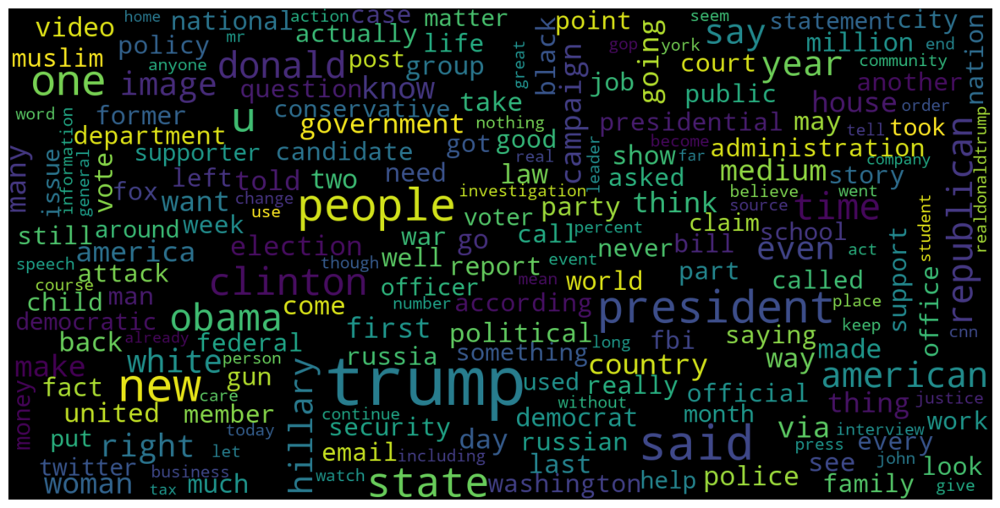

In [135]:
# Word cloud of fake articles
consolidated = ' '.join(
	word for word in Jair_data['text'][Jair_data['label'] == 0].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

<Axes: title={'center': 'Histogram of Top Words Frequency'}, xlabel='Top Words', ylabel='Count'>

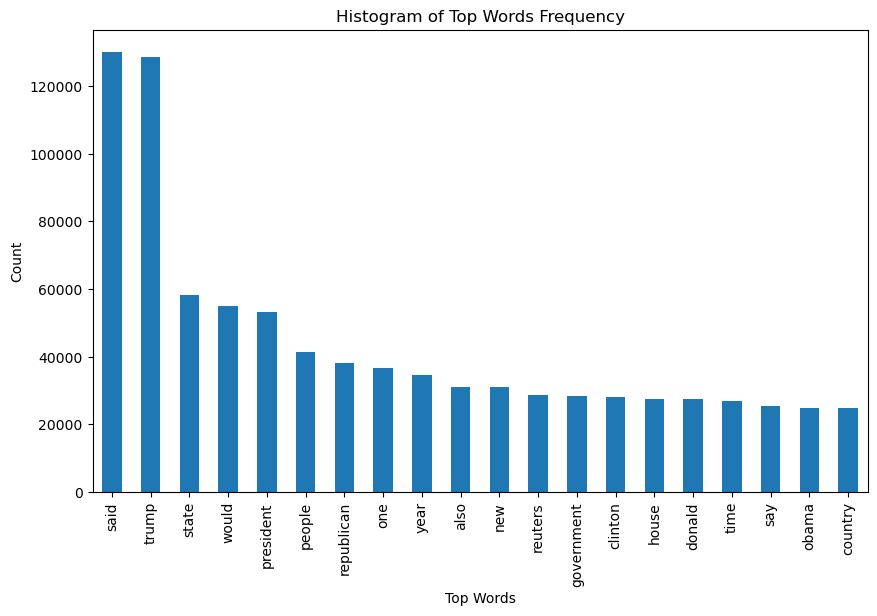

In [136]:
# Frequency of words occured
def get_top_n_words(corpus, n=None):
	vec = CountVectorizer().fit(corpus)
	bag_of_words = vec.transform(corpus)
	sum_words = bag_of_words.sum(axis=0)
	words_freq = [(word, sum_words[0, idx])
				for word, idx in vec.vocabulary_.items()]
	words_freq = sorted(words_freq, key=lambda x: x[1],
						reverse=True)
	return words_freq[:n]


common_words = get_top_n_words(Jair_data['text'], 20)
df1 = pd.DataFrame(common_words, columns=['Review', 'count'])

df1.groupby('Review').sum()['count'].sort_values(ascending=False).plot(
	kind='bar',
	figsize=(10, 6),
	xlabel="Top Words",
	ylabel="Count",
	title="Histogram of Top Words Frequency"
)

Rahul Data

In [137]:
# Check the total rows of data
total_data = len(Rahul_data)
print("\nTotal rows of Rahul data:", total_data)


Total rows of Rahul data: 4986


In [138]:
# Display first five rows
Rahul_data.head()

,text,label
0,Get the latest from TODAY Sign up for our news...,1
1,2d Conan On The Funeral Trump Will Be Invited...,1
2,It’s safe to say that Instagram Stories has fa...,0
3,Much like a certain Amazon goddess with a lass...,0
4,At a time when the perfect outfit is just one ...,0


In [139]:
# Display all columns in dataset
Rahul_data.columns

Index(['text', 'label'], dtype='object')

In [140]:
# Checking missing values 
Rahul_data.isnull().sum() 

text     0
label    0
dtype: int64

In [141]:
# Check of duplicate values
Rahul_data['text'].duplicated().sum()

257

In [142]:
# Check the total number of data points
total_data_points = len(Rahul_data)
print("\nTotal number of data points:", total_data_points)


Total number of data points: 4986


In [143]:
# Occurrences of each unique value in 'label' column
Rahul_data['label'].value_counts()

label
0    2972
1    2014
Name: count, dtype: int64

<Axes: xlabel='label', ylabel='count'>

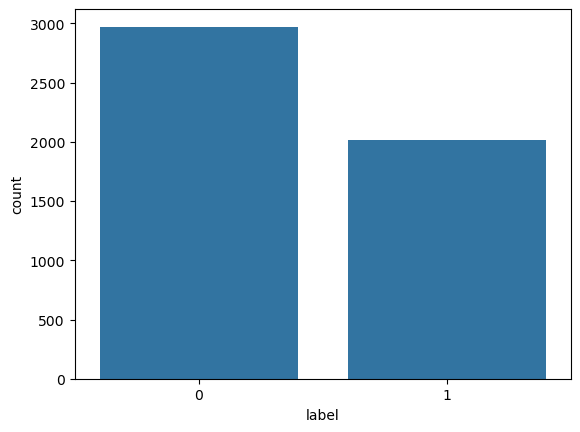

In [144]:
# Occurrences of each unique value in 'label' column (Bar Chart)
sns.countplot(data=Rahul_data,
	x='label',
	order=Rahul_data['label'].value_counts().index)

In [145]:
# NLP Pre-processing of data
Rahul_data["text"] = Rahul_data["text"].apply(pp)

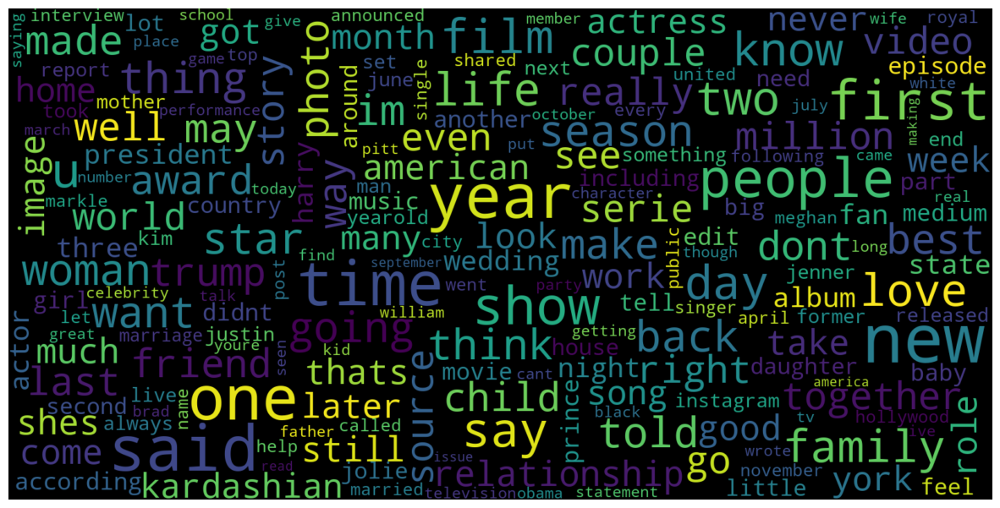

In [146]:
# Word cloud of all articles
consolidated = ' '.join(
	word for word in Rahul_data['text'].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

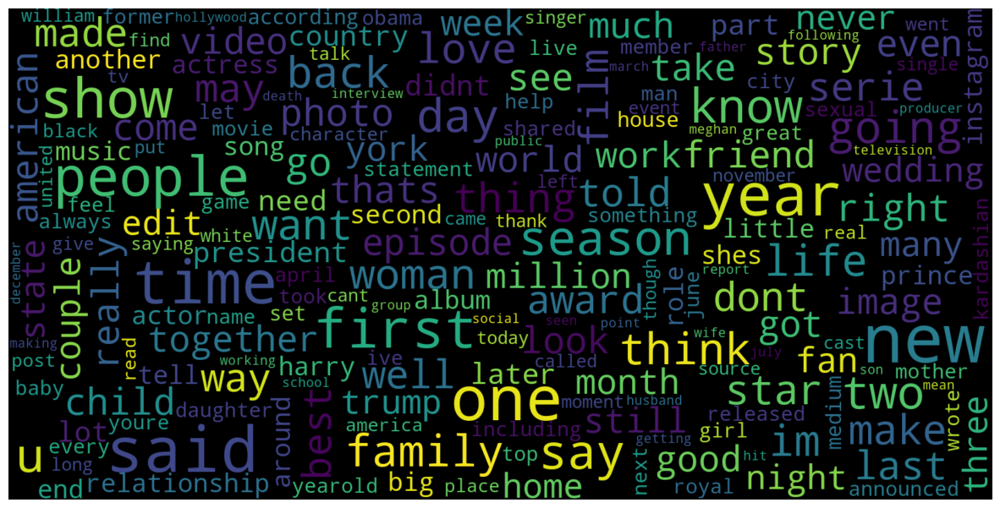

In [147]:
# Word cloud of real articles
consolidated = ' '.join(
	word for word in Rahul_data['text'][Rahul_data['label'] == 0].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

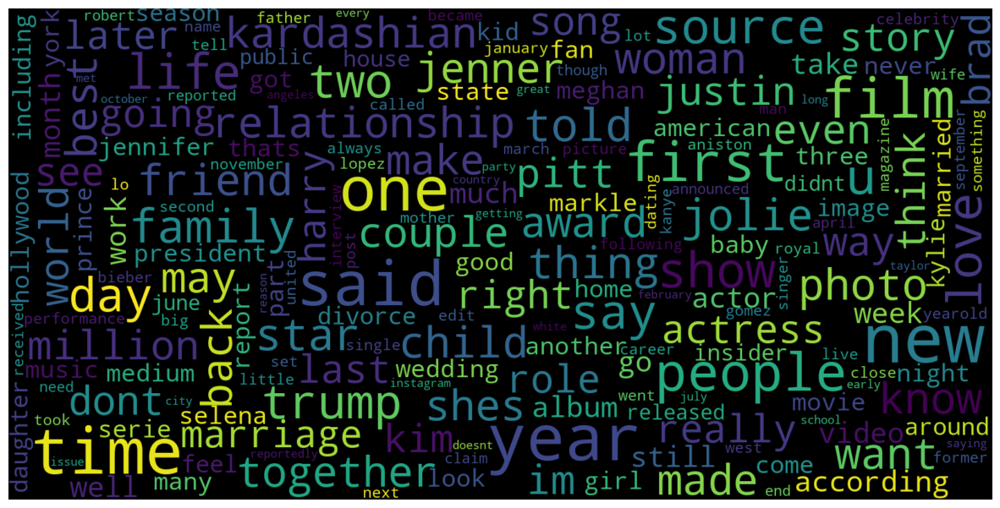

In [148]:
# Word cloud of fake articles
consolidated = ' '.join(
	word for word in Rahul_data['text'][Rahul_data['label'] == 1].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

<Axes: title={'center': 'Histogram of Top Words Frequency'}, xlabel='Top Words', ylabel='Count'>

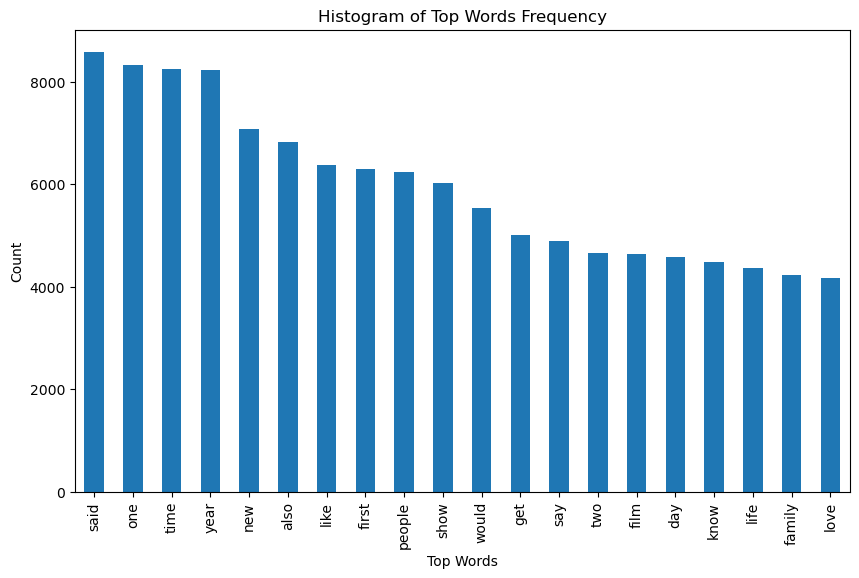

In [149]:
# Frequency of words occured
def get_top_n_words(corpus, n=None):
	vec = CountVectorizer().fit(corpus)
	bag_of_words = vec.transform(corpus)
	sum_words = bag_of_words.sum(axis=0)
	words_freq = [(word, sum_words[0, idx])
				for word, idx in vec.vocabulary_.items()]
	words_freq = sorted(words_freq, key=lambda x: x[1],
						reverse=True)
	return words_freq[:n]


common_words = get_top_n_words(Rahul_data['text'], 20)
df1 = pd.DataFrame(common_words, columns=['Review', 'count'])

df1.groupby('Review').sum()['count'].sort_values(ascending=False).plot(
	kind='bar',
	figsize=(10, 6),
	xlabel="Top Words",
	ylabel="Count",
	title="Histogram of Top Words Frequency"
)

Elvin Data

In [32]:
# Check the total rows of data
total_data = len(elvin_data)
print("\nTotal rows of Elvin data:", total_data)


Total rows of Elvin data: 10700


In [33]:
# Display first five rows
elvin_data.head()

,id,tweet,label
0,1,The CDC currently reports 99031 deaths. In gen...,real
1,2,States reported 1121 deaths a small rise from ...,real
2,3,Politically Correct Woman (Almost) Uses Pandem...,fake
3,4,#IndiaFightsCorona: We have 1524 #COVID testin...,real
4,5,Populous states can generate large case counts...,real


In [34]:
# Display all columns in dataset
elvin_data.columns

Index(['id', 'tweet', 'label'], dtype='object')

In [36]:
# Checking missing values 
elvin_data.isnull().sum() 

id       0
tweet    0
label    0
dtype: int64

In [39]:
# Check of duplicate values
elvin_data['tweet'].duplicated().sum()

1

In [37]:
# Check the total number of data points
total_data_points = len(elvin_data)
print("\nTotal number of data points:", total_data_points)


Total number of data points: 10700


In [38]:
# Occurrences of each unique value in 'label' column
elvin_data['label'].value_counts()

label
real    5600
fake    5100
Name: count, dtype: int64

<Axes: xlabel='label', ylabel='count'>

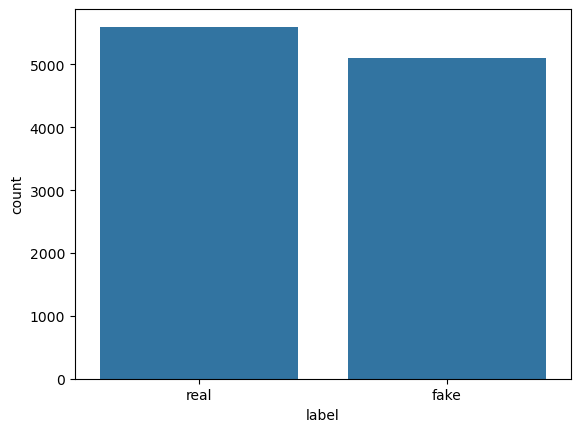

In [41]:
# Occurrences of each unique value in 'label' column (Bar Chart)
sns.countplot(data=elvin_data,
	x='label',
	order=elvin_data['label'].value_counts().index)

In [44]:
# NLP Pre-processing of data
elvin_data["tweet"] = elvin_data["tweet"].apply(pp)

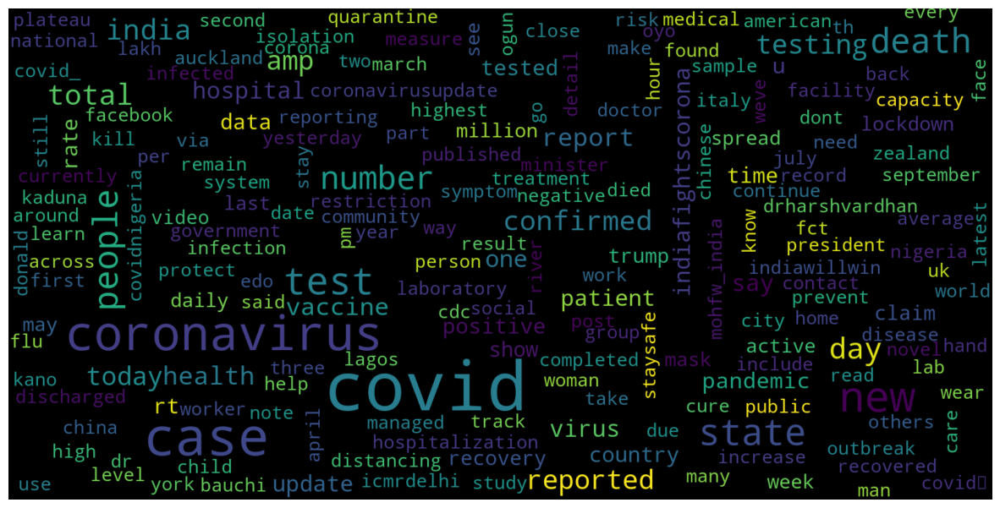

In [46]:
# Word cloud of all articles
consolidated = ' '.join(
	word for word in elvin_data['tweet'].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

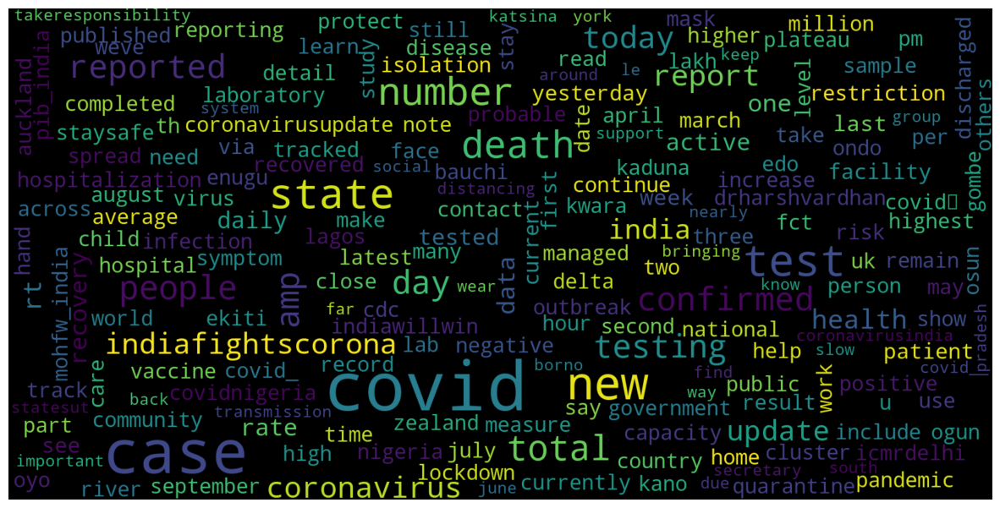

In [47]:
# Word cloud of real articles
consolidated = ' '.join(
	word for word in elvin_data['tweet'][elvin_data['label'] == "real"].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

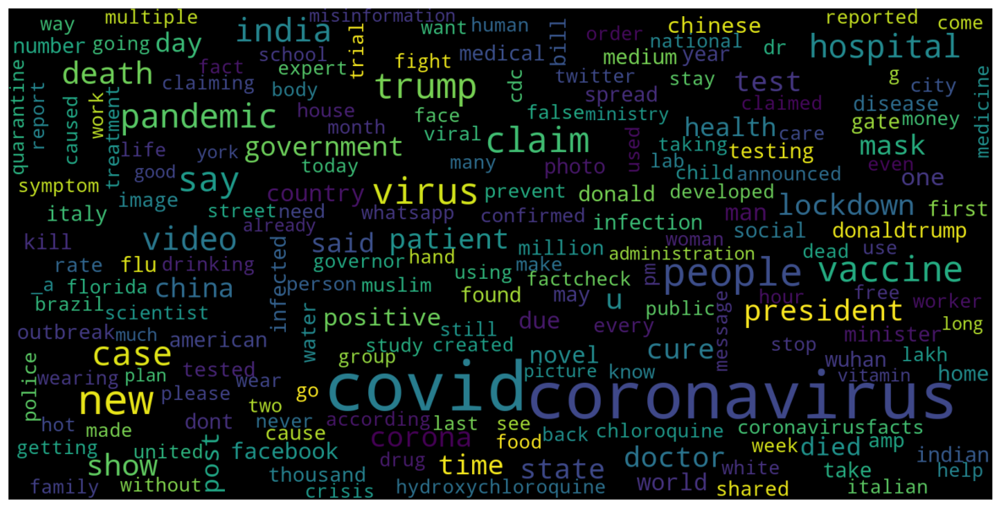

In [48]:
# Word cloud of fake articles
consolidated = ' '.join(
	word for word in elvin_data['tweet'][elvin_data['label'] == "fake"].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

<Axes: title={'center': 'Histogram of Top Words Frequency'}, xlabel='Top Words', ylabel='Count'>

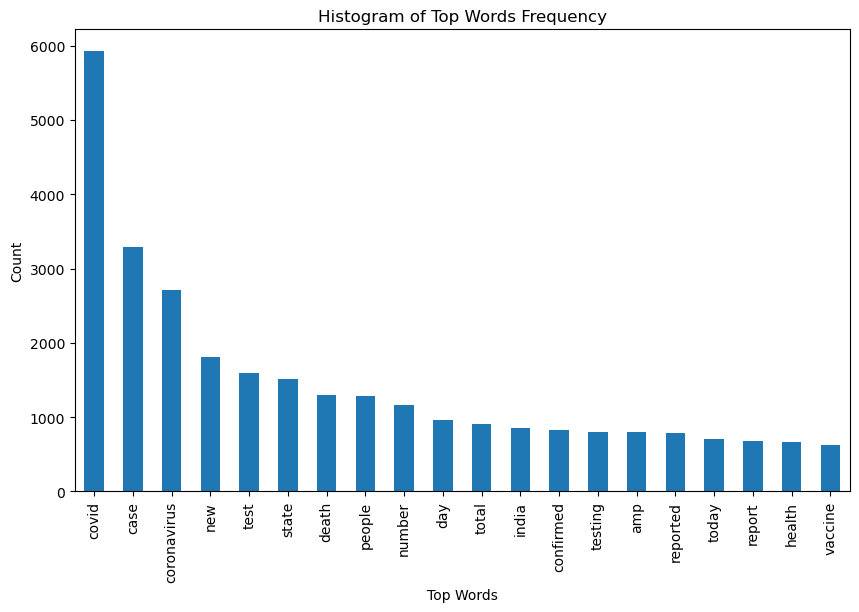

In [50]:
# Frequency of words occured
def get_top_n_words(corpus, n=None):
	vec = CountVectorizer().fit(corpus)
	bag_of_words = vec.transform(corpus)
	sum_words = bag_of_words.sum(axis=0)
	words_freq = [(word, sum_words[0, idx])
				for word, idx in vec.vocabulary_.items()]
	words_freq = sorted(words_freq, key=lambda x: x[1],
						reverse=True)
	return words_freq[:n]


common_words = get_top_n_words(elvin_data['tweet'], 20)
df1 = pd.DataFrame(common_words, columns=['Review', 'count'])

df1.groupby('Review').sum()['count'].sort_values(ascending=False).plot(
	kind='bar',
	figsize=(10, 6),
	xlabel="Top Words",
	ylabel="Count",
	title="Histogram of Top Words Frequency"
)

Jruvika Data

In [51]:
# Check the total rows of data
total_data = len(jruvika_data)
print("\nTotal rows of Jruvika data:", total_data)


Total rows of Jruvika data: 4009


In [52]:
# Display first five rows
jruvika_data.head()

,URLs,Headline,Body,Label
0,http://www.bbc.com/news/world-us-canada-414191...,Four ways Bob Corker skewered Donald Trump,Image copyright Getty Images\nOn Sunday mornin...,1
1,https://www.reuters.com/article/us-filmfestiva...,Linklater's war veteran comedy speaks to moder...,"LONDON (Reuters) - “Last Flag Flying”, a comed...",1
2,https://www.nytimes.com/2017/10/09/us/politics...,Trump’s Fight With Corker Jeopardizes His Legi...,The feud broke into public view last week when...,1
3,https://www.reuters.com/article/us-mexico-oil-...,Egypt's Cheiron wins tie-up with Pemex for Mex...,MEXICO CITY (Reuters) - Egypt’s Cheiron Holdin...,1
4,http://www.cnn.com/videos/cnnmoney/2017/10/08/...,Jason Aldean opens 'SNL' with Vegas tribute,"Country singer Jason Aldean, who was performin...",1


In [53]:
# Display all columns in dataset
jruvika_data.columns

Index(['URLs', 'Headline', 'Body', 'Label'], dtype='object')

In [54]:
# Checking missing values 
jruvika_data.isnull().sum() 

URLs         0
Headline     0
Body        21
Label        0
dtype: int64

In [55]:
# Check of duplicate values
jruvika_data['Body'].duplicated().sum()

1145

In [56]:
# Check the total number of data points
total_data_points = len(jruvika_data)
print("\nTotal number of data points:", total_data_points)


Total number of data points: 4009


In [57]:
# Occurrences of each unique value in 'label' column
jruvika_data['Label'].value_counts()

Label
0    2137
1    1872
Name: count, dtype: int64

<Axes: xlabel='Label', ylabel='count'>

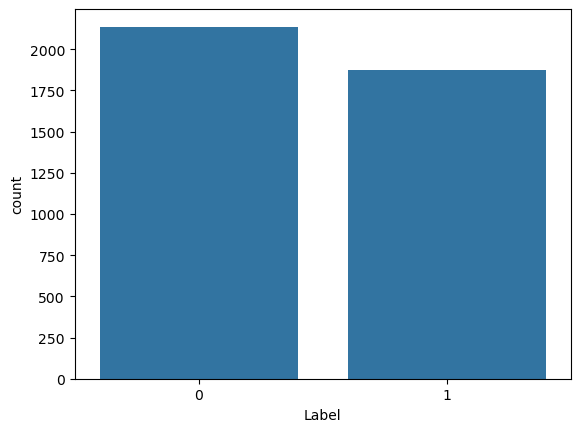

In [60]:
# Occurrences of each unique value in 'label' column (Bar Chart)
sns.countplot(data=jruvika_data,
	x='Label',
	order=jruvika_data['Label'].value_counts().index)

In [61]:
# NLP Pre-processing of data
jruvika_data["Body"] = jruvika_data["Body"].apply(pp)

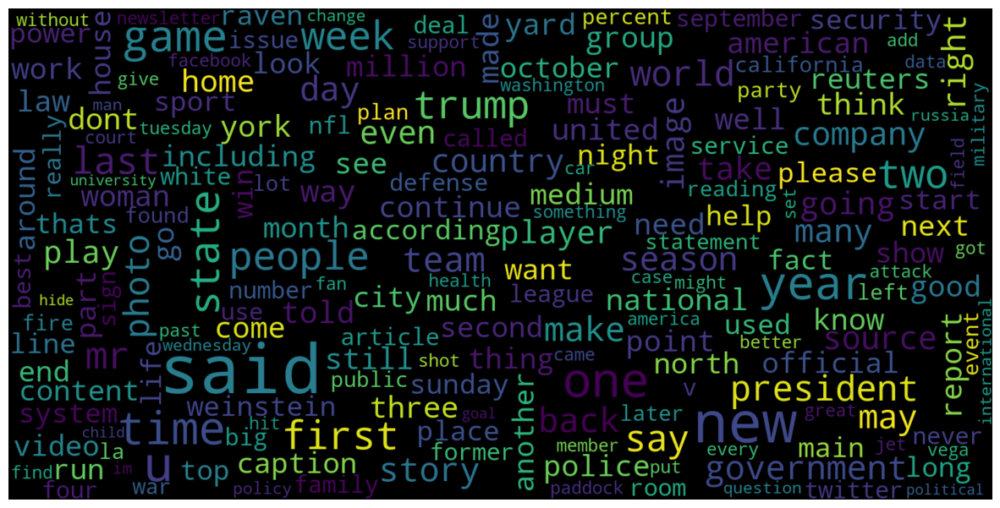

In [62]:
# Word cloud of all articles
consolidated = ' '.join(
	word for word in jruvika_data['Body'].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

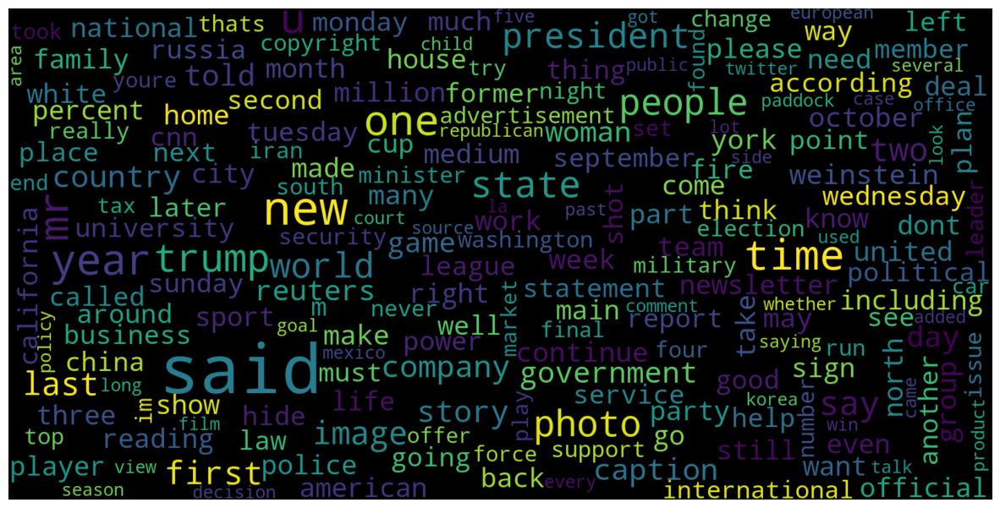

In [65]:
# Word cloud of real articles
consolidated = ' '.join(
	word for word in jruvika_data['Body'][jruvika_data['Label'] == 1].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

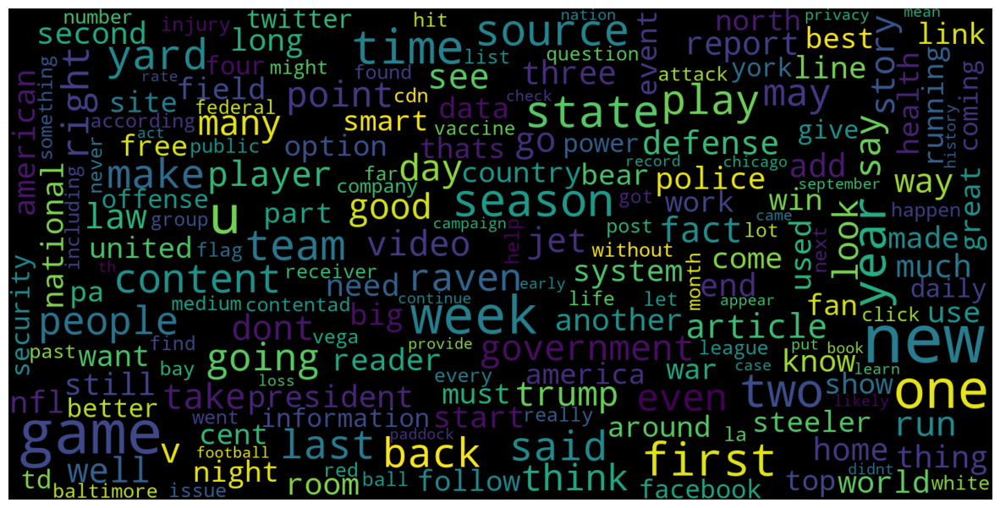

In [66]:
# Word cloud of fake articles
consolidated = ' '.join(
	word for word in jruvika_data['Body'][jruvika_data['Label'] == 0].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

<Axes: title={'center': 'Histogram of Top Words Frequency'}, xlabel='Top Words', ylabel='Count'>

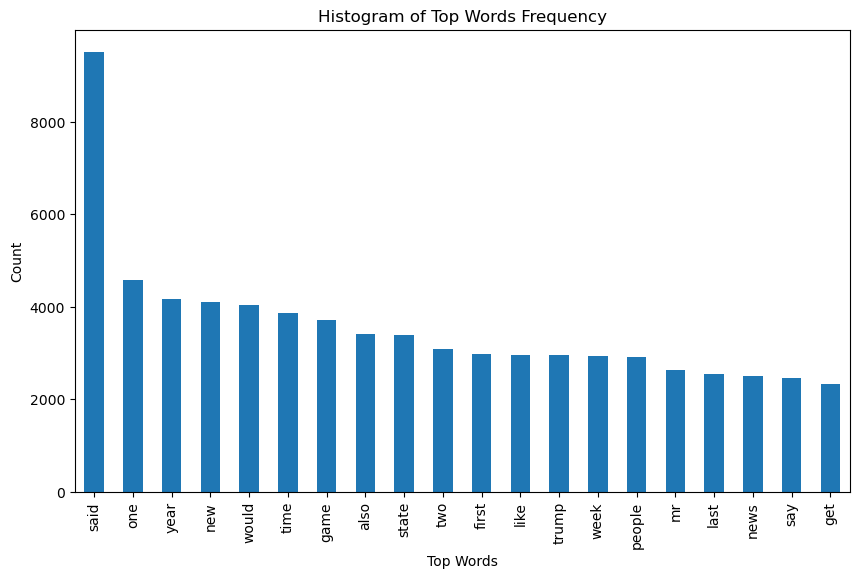

In [67]:
# Frequency of words occured
def get_top_n_words(corpus, n=None):
	vec = CountVectorizer().fit(corpus)
	bag_of_words = vec.transform(corpus)
	sum_words = bag_of_words.sum(axis=0)
	words_freq = [(word, sum_words[0, idx])
				for word, idx in vec.vocabulary_.items()]
	words_freq = sorted(words_freq, key=lambda x: x[1],
						reverse=True)
	return words_freq[:n]


common_words = get_top_n_words(jruvika_data['Body'], 20)
df1 = pd.DataFrame(common_words, columns=['Review', 'count'])

df1.groupby('Review').sum()['count'].sort_values(ascending=False).plot(
	kind='bar',
	figsize=(10, 6),
	xlabel="Top Words",
	ylabel="Count",
	title="Histogram of Top Words Frequency"
)

Saurabh Data

In [68]:
# Check the total rows of data
total_data = len(saurabh_data)
print("\nTotal rows of Saurabh data:", total_data)


Total rows of Saurabh data: 72134


In [69]:
# Display first five rows
saurabh_data.head()

,Unnamed: 0,title,text,label
0,0,LAW ENFORCEMENT ON HIGH ALERT Following Threat...,No comment is expected from Barack Obama Membe...,1
1,1,NaN,Did they post their votes for Hillary already?,1
2,2,UNBELIEVABLE! OBAMA’S ATTORNEY GENERAL SAYS MO...,"Now, most of the demonstrators gathered last ...",1
3,3,"Bobby Jindal, raised Hindu, uses story of Chri...",A dozen politically active pastors came here f...,0
4,4,SATAN 2: Russia unvelis an image of its terrif...,"The RS-28 Sarmat missile, dubbed Satan 2, will...",1


In [70]:
# Display all columns in dataset
saurabh_data.columns

Index(['Unnamed: 0', 'title', 'text', 'label'], dtype='object')

In [71]:
# Checking missing values 
saurabh_data.isnull().sum() 

Unnamed: 0      0
title         558
text           39
label           0
dtype: int64

In [72]:
# Check of duplicate values
saurabh_data['text'].duplicated().sum()

9415

In [73]:
# Check the total number of data points
total_data_points = len(saurabh_data)
print("\nTotal number of data points:", total_data_points)


Total number of data points: 72134


In [74]:
# Occurrences of each unique value in 'label' column
saurabh_data['label'].value_counts()

label
1    37106
0    35028
Name: count, dtype: int64

<Axes: xlabel='label', ylabel='count'>

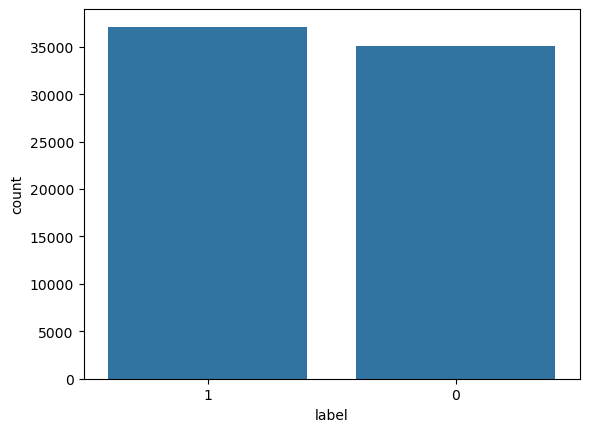

In [75]:
# Occurrences of each unique value in 'label' column (Bar Chart)
sns.countplot(data=saurabh_data,
	x='label',
	order=saurabh_data['label'].value_counts().index)

In [76]:
# NLP Pre-processing of data
saurabh_data["text"] = saurabh_data["text"].apply(pp)

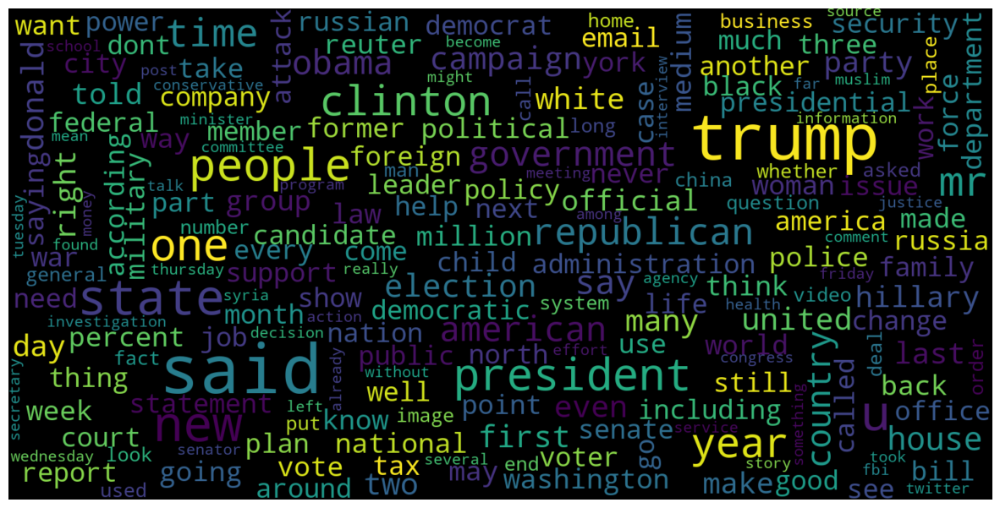

In [77]:
# Word cloud of all articles
consolidated = ' '.join(
	word for word in saurabh_data['text'].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

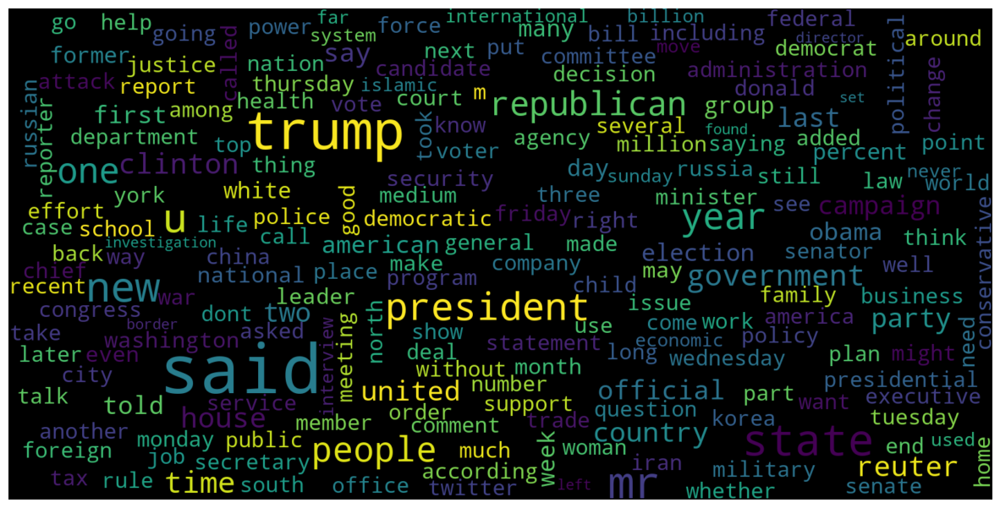

In [78]:
# Word cloud of real articles
consolidated = ' '.join(
	word for word in saurabh_data['text'][saurabh_data['label'] == 0].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

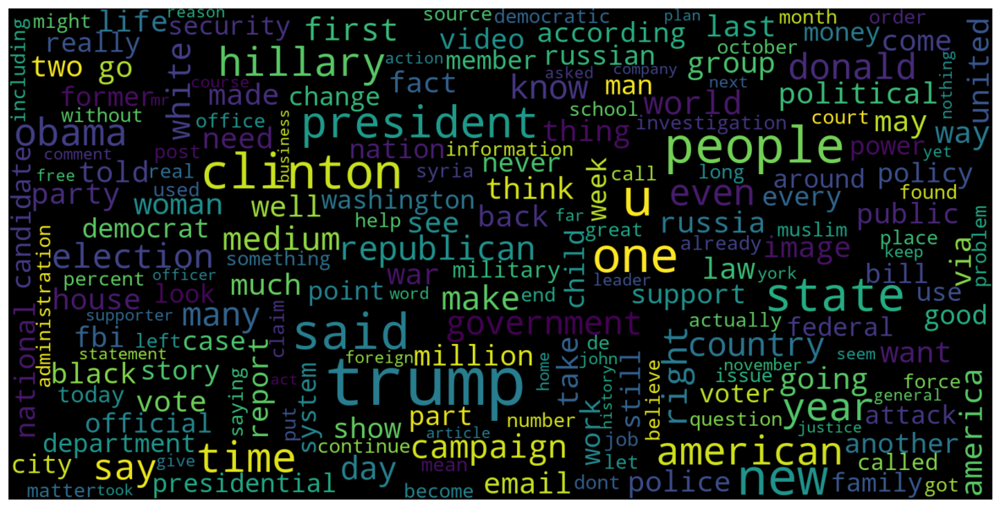

In [79]:
# Word cloud of fake articles
consolidated = ' '.join(
	word for word in saurabh_data['text'][saurabh_data['label'] == 1].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

<Axes: title={'center': 'Histogram of Top Words Frequency'}, xlabel='Top Words', ylabel='Count'>

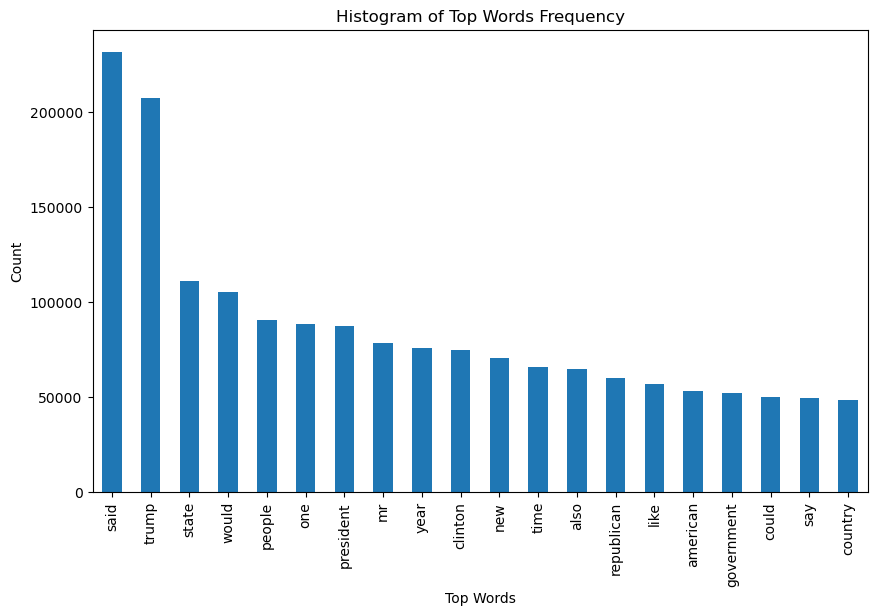

In [80]:
# Frequency of words occured
def get_top_n_words(corpus, n=None):
	vec = CountVectorizer().fit(corpus)
	bag_of_words = vec.transform(corpus)
	sum_words = bag_of_words.sum(axis=0)
	words_freq = [(word, sum_words[0, idx])
				for word, idx in vec.vocabulary_.items()]
	words_freq = sorted(words_freq, key=lambda x: x[1],
						reverse=True)
	return words_freq[:n]


common_words = get_top_n_words(saurabh_data['text'], 20)
df1 = pd.DataFrame(common_words, columns=['Review', 'count'])

df1.groupby('Review').sum()['count'].sort_values(ascending=False).plot(
	kind='bar',
	figsize=(10, 6),
	xlabel="Top Words",
	ylabel="Count",
	title="Histogram of Top Words Frequency"
)

Challenge Data

In [81]:
# Check the total rows of data
total_data = len(challenge_data)
print("\nTotal rows of Challenge data:", total_data)


Total rows of Challenge data: 26000


In [82]:
# Display first five rows
challenge_data.head()

,id,title,author,text,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1


In [83]:
# Display all columns in dataset
challenge_data.columns

Index(['id', 'title', 'author', 'text', 'label'], dtype='object')

In [84]:
# Checking missing values 
challenge_data.isnull().sum() 

id           0
title      680
author    2460
text        46
label        0
dtype: int64

In [85]:
# Check of duplicate values
challenge_data['text'].duplicated().sum()

567

In [86]:
# Check the total number of data points
total_data_points = len(challenge_data)
print("\nTotal number of data points:", total_data_points)


Total number of data points: 26000


In [87]:
# Occurrences of each unique value in 'label' column
challenge_data['label'].value_counts()

label
1    13274
0    12726
Name: count, dtype: int64

<Axes: xlabel='label', ylabel='count'>

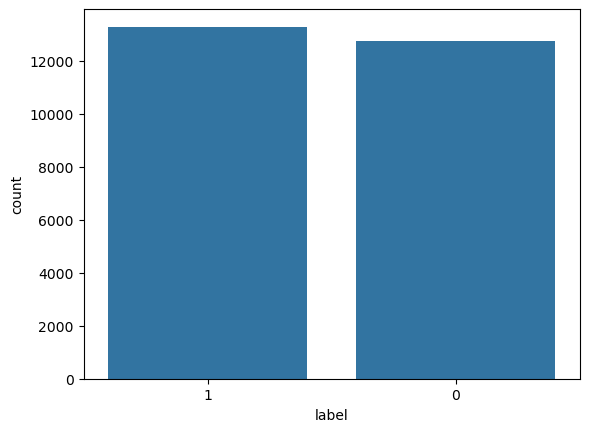

In [88]:
# Occurrences of each unique value in 'label' column (Bar Chart)
sns.countplot(data=challenge_data,
	x='label',
	order=challenge_data['label'].value_counts().index)

In [89]:
# NLP Pre-processing of data
challenge_data["text"] = challenge_data["text"].apply(pp)

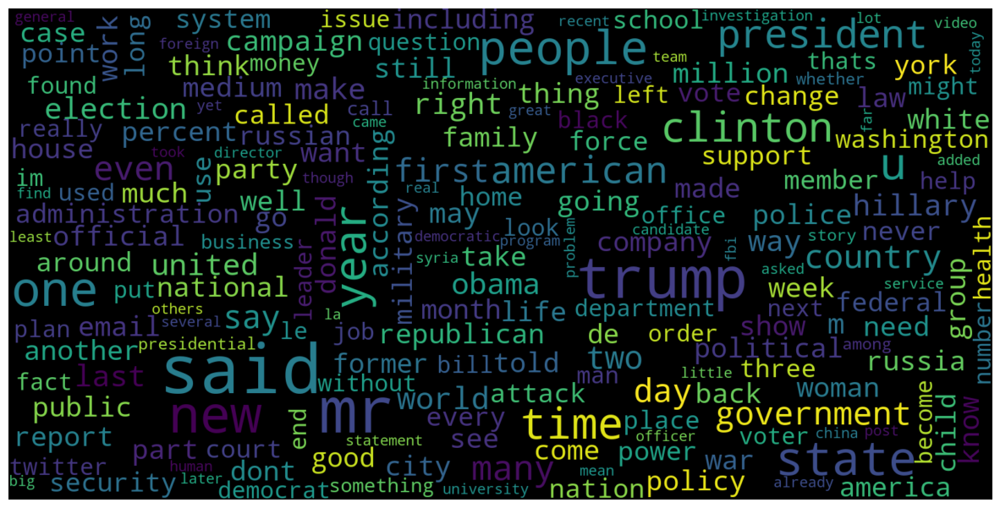

In [90]:
# Word cloud of all articles
consolidated = ' '.join(
	word for word in challenge_data['text'].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

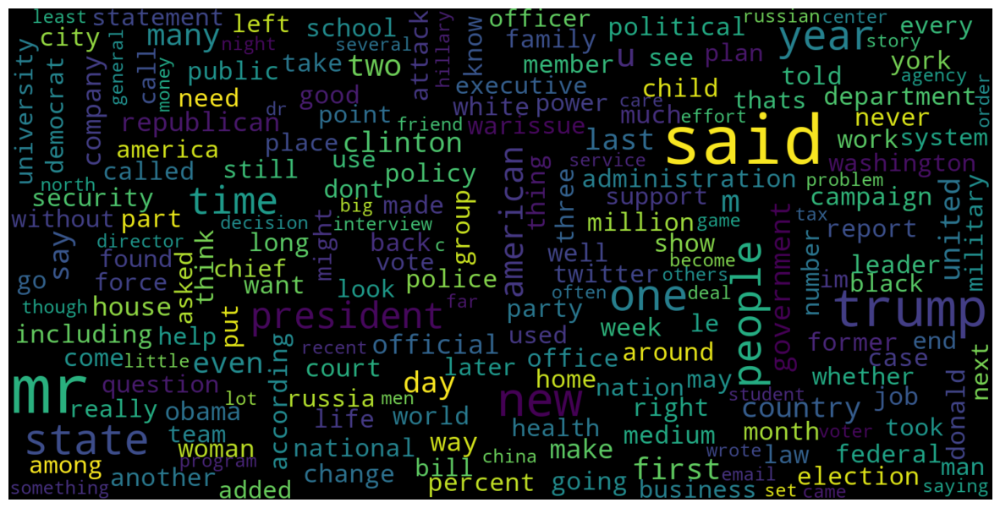

In [91]:
# Word cloud of real articles
consolidated = ' '.join(
	word for word in challenge_data['text'][challenge_data['label'] == 0].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

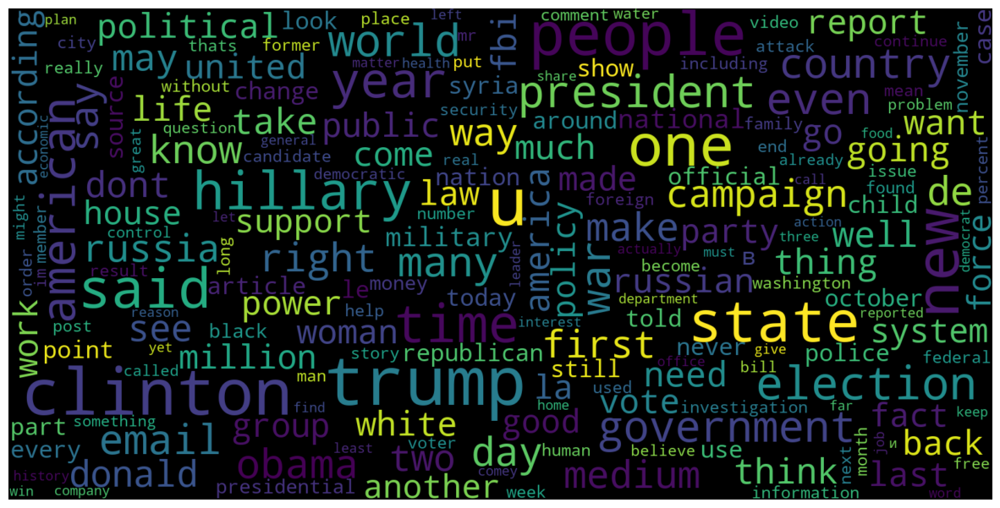

In [92]:
# Word cloud of fake articles
consolidated = ' '.join(
	word for word in challenge_data['text'][challenge_data['label'] == 1].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

<Axes: title={'center': 'Histogram of Top Words Frequency'}, xlabel='Top Words', ylabel='Count'>

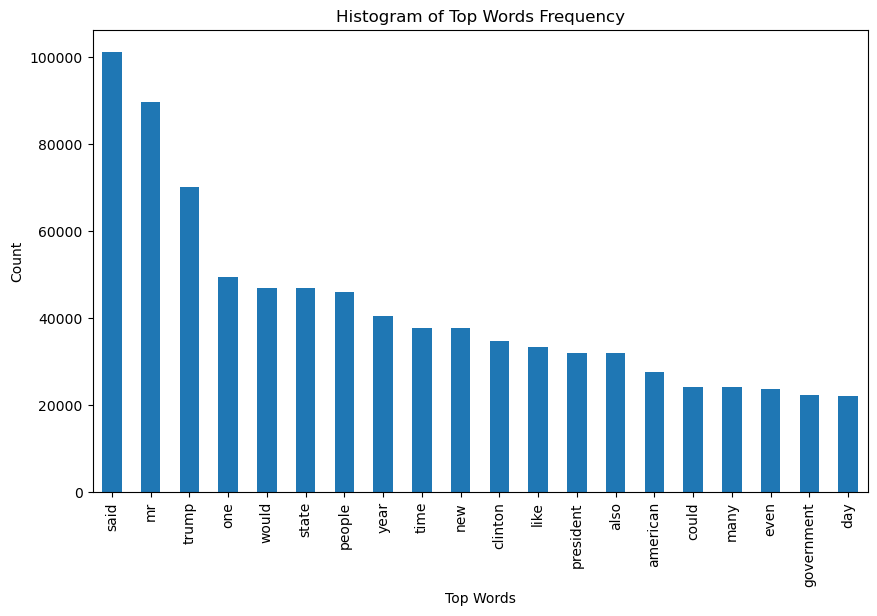

In [93]:
# Frequency of words occured
def get_top_n_words(corpus, n=None):
	vec = CountVectorizer().fit(corpus)
	bag_of_words = vec.transform(corpus)
	sum_words = bag_of_words.sum(axis=0)
	words_freq = [(word, sum_words[0, idx])
				for word, idx in vec.vocabulary_.items()]
	words_freq = sorted(words_freq, key=lambda x: x[1],
						reverse=True)
	return words_freq[:n]


common_words = get_top_n_words(challenge_data['text'], 20)
df1 = pd.DataFrame(common_words, columns=['Review', 'count'])

df1.groupby('Review').sum()['count'].sort_values(ascending=False).plot(
	kind='bar',
	figsize=(10, 6),
	xlabel="Top Words",
	ylabel="Count",
	title="Histogram of Top Words Frequency"
)

IEEE Data

In [95]:
# Check the total rows of data
total_data = len(ieee_data)
print("\nTotal rows of IEEE data:", total_data)


Total rows of IEEE data: 17324


In [96]:
# Display first five rows
ieee_data.head()

,id,date,speaker,statement,sources,paragraph_based_content,fullText_based_content,label_fnn
0,1636,2010-03-28T17:45:34-04:00,Charlie Crist,"Rubio's tax swap proposal ""would have been a m...",['http://blogs.tampabay.com/buzz/files/040307l...,['Gov. Charlie Crist launched what amounts to ...,Gov. Charlie Crist launched what amounts to a ...,fake
1,4352,2011-08-29T06:00:00-04:00,Bobby Scott,"""The estimated savings of this (debt ceiling) ...",['http://www.bobbyscott.house.gov/index.php?op...,"['U.S. Rep. Bobby Scott, D-3rd, was not please...","U.S. Rep. Bobby Scott, D-3rd, was not pleased ...",real
2,16471,2019-02-12T17:35:38-05:00,Wisconsin Republican Legislative leaders,"Foxconn has already ""made a positive impact ac...",['https://www.wispolitics.com/2019/sen-fitzger...,"[""Amid reports questioning Foxconn Technology ...",Amid reports questioning Foxconn Technology Gr...,fake
3,1557,2010-03-05T18:24:02-05:00,Dave Aronberg,"Says Gov. Charlie Crist has called him ""a rock...","['http://www.davearonberg.com/about', 'http://...","[""State Sen. Dave Aronberg, a Democratic candi...","State Sen. Dave Aronberg, a Democratic candida...",real
4,12826,2016-07-29T18:09:31-04:00,Jeannette Vaught,"""Only five Texas counties account for almost 9...",['http://www.mystatesman.com/news/news/opinion...,['From the citrus of the Rio Grande Valley to ...,From the citrus of the Rio Grande Valley to th...,fake


In [97]:
# Display all columns in dataset
ieee_data.columns

Index(['id', 'date', 'speaker', 'statement', 'sources',
       'paragraph_based_content', 'fullText_based_content', 'label_fnn'],
      dtype='object')

In [98]:
# Checking missing values 
ieee_data.isnull().sum() 

id                         0
date                       0
speaker                    0
statement                  0
sources                    0
paragraph_based_content    0
fullText_based_content     0
label_fnn                  0
dtype: int64

In [99]:
# Check of duplicate values
ieee_data['paragraph_based_content'].duplicated().sum()

1

In [100]:
# Check the total number of data points
total_data_points = len(ieee_data)
print("\nTotal number of data points:", total_data_points)


Total number of data points: 17324


In [101]:
# Occurrences of each unique value in 'label' column
ieee_data['label_fnn'].value_counts()

label_fnn
real    8767
fake    8557
Name: count, dtype: int64

<Axes: xlabel='label_fnn', ylabel='count'>

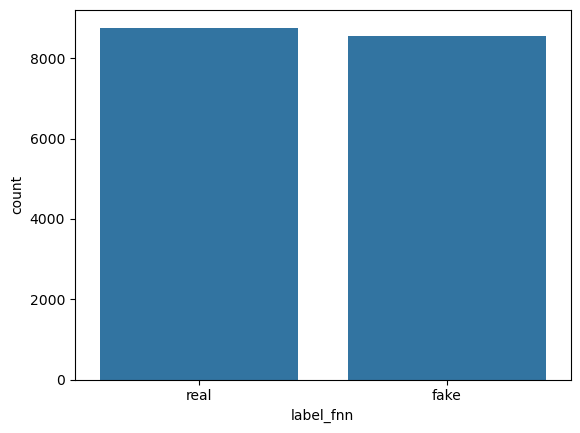

In [102]:
# Occurrences of each unique value in 'label' column (Bar Chart)
sns.countplot(data=ieee_data,
	x='label_fnn',
	order=ieee_data['label_fnn'].value_counts().index)

In [103]:
# NLP Pre-processing of data
ieee_data["paragraph_based_content"] = ieee_data["paragraph_based_content"].apply(pp)

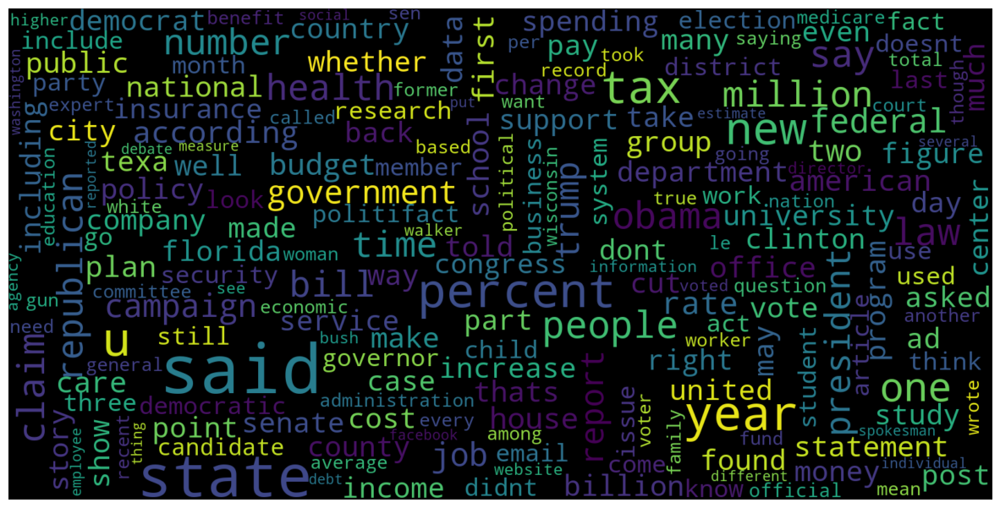

In [104]:
# Word cloud of all articles
consolidated = ' '.join(
	word for word in ieee_data['paragraph_based_content'].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

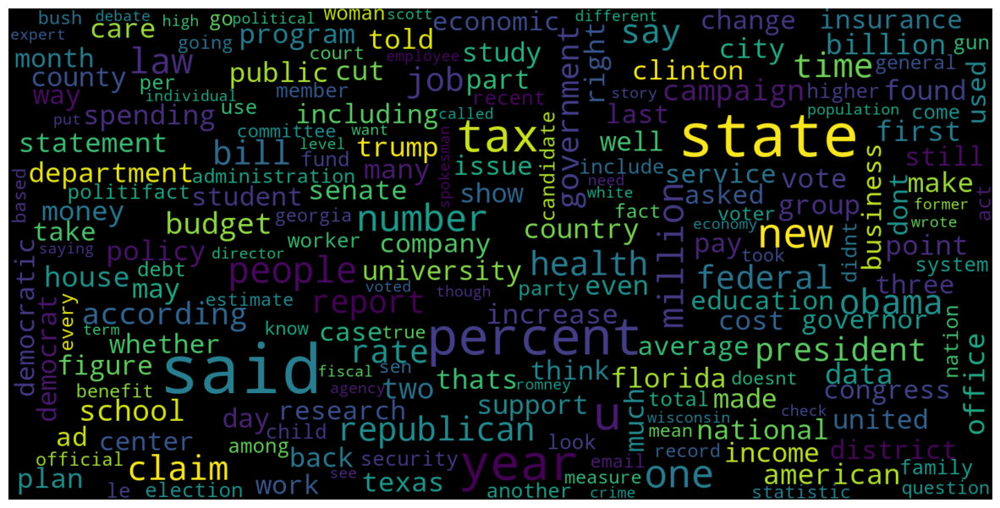

In [107]:
# Word cloud of real articles
consolidated = ' '.join(
	word for word in ieee_data['paragraph_based_content'][ieee_data['label_fnn'] == "real"].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

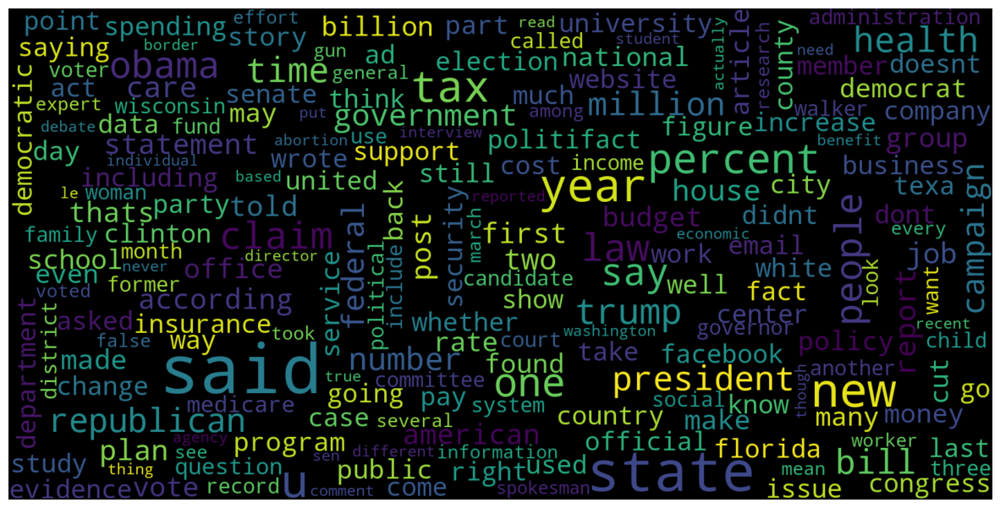

In [108]:
# Word cloud of fake articles
consolidated = ' '.join(
	word for word in ieee_data['paragraph_based_content'][ieee_data['label_fnn'] == "fake"].astype(str))
wordCloud = WordCloud(width=1600,
					height=800,
					random_state=21,
					max_font_size=110,
					collocations=False)
plt.figure(figsize=(15, 10))
plt.imshow(wordCloud.generate(consolidated), interpolation='bilinear')
plt.axis('off')
plt.show()

<Axes: title={'center': 'Histogram of Top Words Frequency'}, xlabel='Top Words', ylabel='Count'>

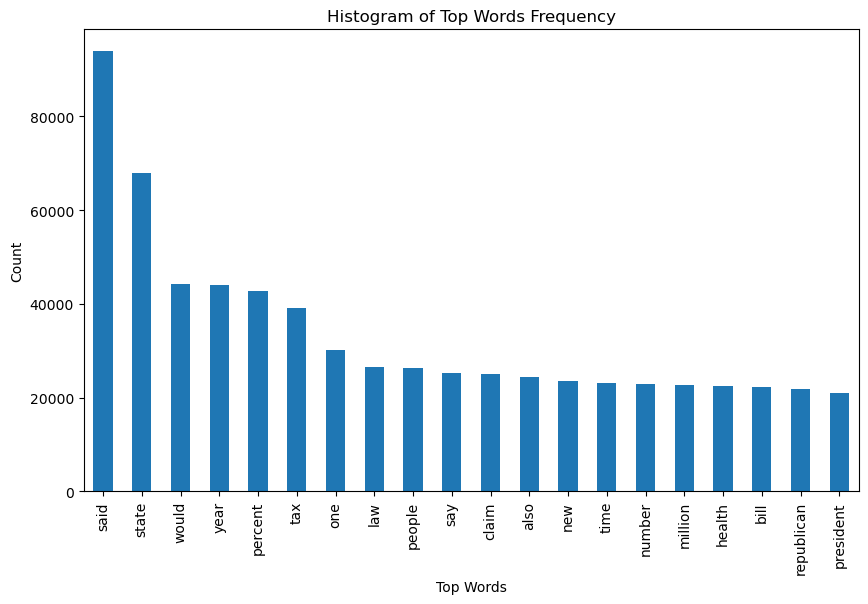

In [109]:
# Frequency of words occured
def get_top_n_words(corpus, n=None):
	vec = CountVectorizer().fit(corpus)
	bag_of_words = vec.transform(corpus)
	sum_words = bag_of_words.sum(axis=0)
	words_freq = [(word, sum_words[0, idx])
				for word, idx in vec.vocabulary_.items()]
	words_freq = sorted(words_freq, key=lambda x: x[1],
						reverse=True)
	return words_freq[:n]


common_words = get_top_n_words(ieee_data['paragraph_based_content'], 20)
df1 = pd.DataFrame(common_words, columns=['Review', 'count'])

df1.groupby('Review').sum()['count'].sort_values(ascending=False).plot(
	kind='bar',
	figsize=(10, 6),
	xlabel="Top Words",
	ylabel="Count",
	title="Histogram of Top Words Frequency"
)